In [1]:
%load_ext autoreload
%autoreload 2
!hostname
!pwd
import os, sys
print(sys.executable)
os.environ['CUDA_VISIBLE_DEVICES'] = "4"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

fish-gcp005
/home/akarshkumar0101/nca-alife/src
/home/akarshkumar0101/miniconda3/envs/nca-alife-jax/bin/python


In [2]:
import os, sys, glob, pickle
from functools import partial

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from tqdm.auto import tqdm
from einops import rearrange, reduce, repeat

In [3]:
import experiment_utils
import util

In [4]:
import jax
import jax.numpy as jnp
from jax.random import split

In [5]:
from clip_jax import MyFlaxCLIP
from models_lenia import Lenia

In [6]:
from umap import UMAP

In [43]:
clip_model = MyFlaxCLIP()
sim = Lenia()

/home/akarshkumar0101/miniconda3/envs/nca-alife-jax/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [286]:
@jax.jit
def unroll_params(rng, params):
    def step(state, _rng):
        next_state = sim.step_state(_rng, state, params)
        return next_state, state
    state_init = sim.init_state(rng, params)
    state_final, state_vid = jax.lax.scan(step, state_init, split(rng, 256))

    img_init = sim.render_state(state_init, params=params, img_size=224)
    img = sim.render_state(state_final, params=params, img_size=224)
    z_img = clip_model.embed_img(img)
    return dict(img_init=img_init, img=img, z_img=z_img)

In [287]:
rng = jax.random.PRNGKey(1)
params = jnp.zeros(sim.default_params(rng).shape)


params_all = 0.1 * jax.random.normal(rng, (1000, *sim.default_params(rng).shape))
params_all.shape

(1000, 3117)

In [288]:
data = []
for params in tqdm(params_all):
    di = unroll_params(rng, params)
    data.append(di)
data = jax.tree.map(lambda *x: jnp.stack(x, axis=0), *data)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [289]:
data['z_img'].shape

(1000, 512)

In [290]:
x = UMAP(metric='cosine').fit_transform(np.array(data['z_img']))

In [291]:
x.sum(axis=-1).argmin(), x.sum(axis=-1).argmax()

(784, 323)

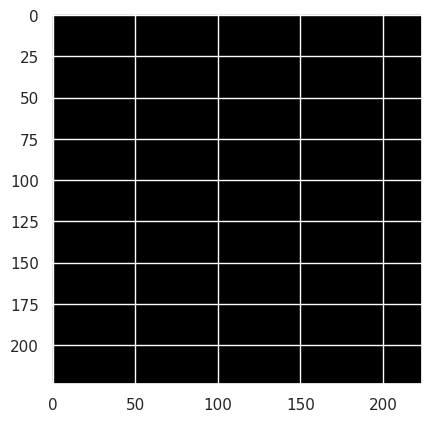

In [292]:
plt.imshow(data['img'][x.sum(axis=-1).argmin()])

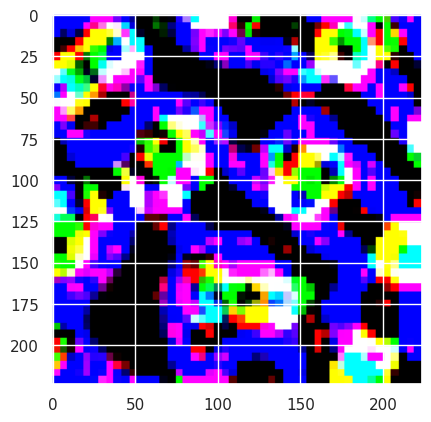

In [293]:
plt.imshow(data['img'][x.sum(axis=-1).argmax()])

In [294]:
from sklearn.cluster import KMeans

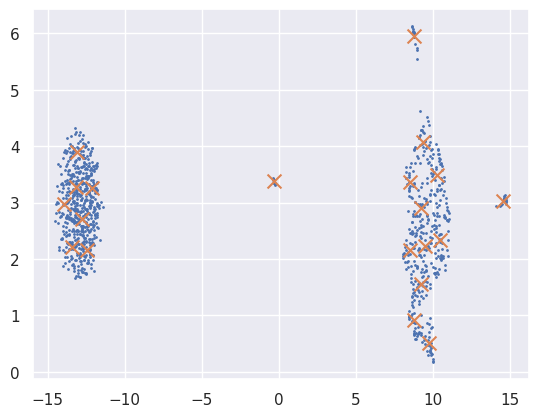

In [295]:
kmeans = KMeans(n_clusters=20).fit(x)
plt.scatter(*x.T, s=1.)
plt.scatter(*kmeans.cluster_centers_.T, s=100., marker='x')

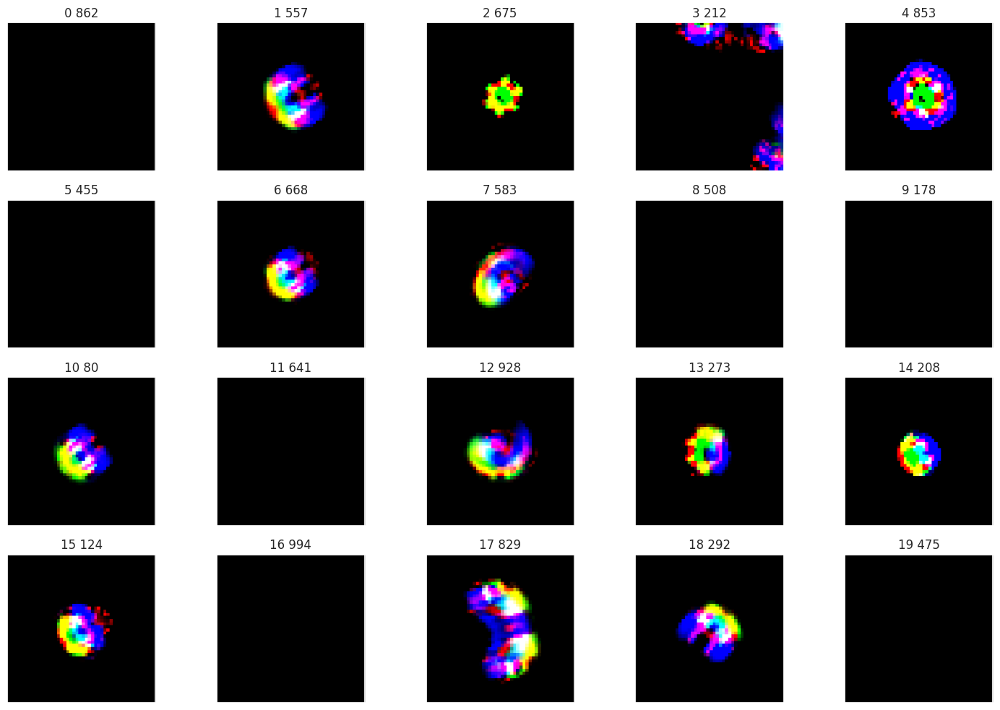

In [304]:
d = kmeans.transform(x)

plt.figure(figsize=(15, 10))
for c in range(kmeans.n_clusters):
    i = d[:, c].argmin()
    plt.subplot(4, 5, c+1)
    plt.imshow(data['img'][i])
    plt.title(f"{c} {i}")
    plt.grid(False); plt.xticks([]); plt.yticks([])

plt.tight_layout()
plt.show()


In [297]:
kmeans.cluster_centers_

array([[-12.128945  ,   3.253166  ],
       [  9.511689  ,   2.2313936 ],
       [ -0.30601287,   3.3842254 ],
       [ 14.589448  ,   3.0243998 ],
       [  8.784938  ,   5.951873  ],
       [-13.925804  ,   2.9725382 ],
       [  9.260364  ,   2.9005988 ],
       [  9.242321  ,   1.5590856 ],
       [-12.412835  ,   2.1536286 ],
       [-13.101959  ,   3.8918273 ],
       [ 10.311959  ,   3.4863875 ],
       [-13.396959  ,   2.2058783 ],
       [ 10.505398  ,   2.335772  ],
       [  8.499543  ,   2.154203  ],
       [  8.521455  ,   3.3693044 ],
       [  9.356039  ,   4.075372  ],
       [-13.158801  ,   3.2809336 ],
       [  9.747997  ,   0.5143304 ],
       [  8.787635  ,   0.90928674],
       [-12.763051  ,   2.7115235 ]], dtype=float32)

In [298]:
z = data['z_img']

In [299]:
z.shape

(1000, 512)

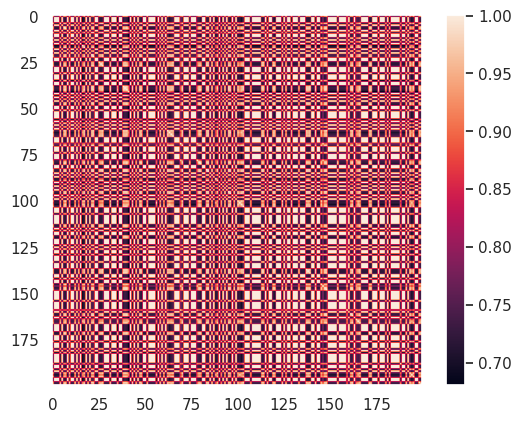

In [300]:
plt.imshow((z@z.T)[:200, :200])
plt.grid(False)
plt.colorbar()

  0%|          | 0/2000 [00:00<?, ?it/s]

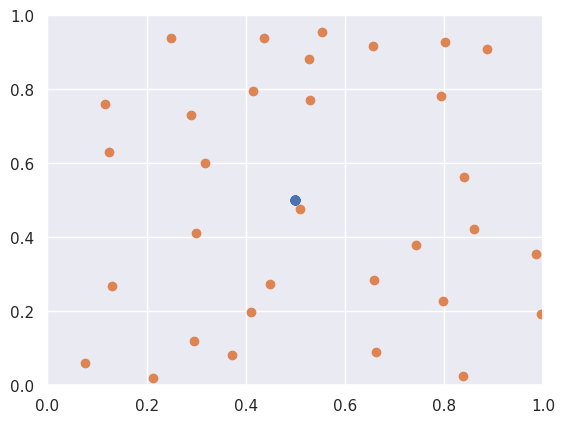

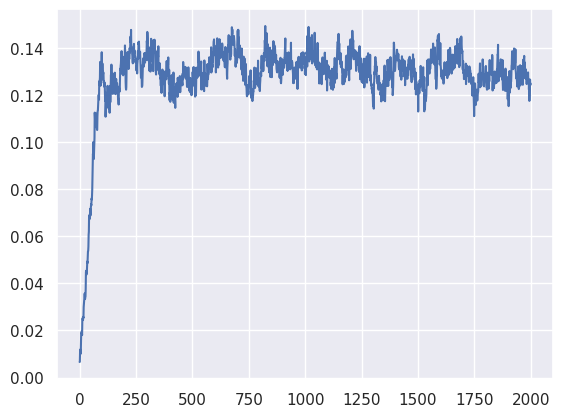

In [302]:
A = np.random.randn(32, 2)*0+0.5

plt.scatter(*A.T); plt.xlim(0, 1); plt.ylim(0, 1)
fitness = []
# plt.show()
for i in tqdm(range(2000)):
    idx = np.random.randint(0, len(A))
    a = A[idx]
    a = a + 1e-1*np.random.randn(2)
    
    B = np.concatenate([A, a[None]])
    D = np.linalg.norm(B[:, None, :] - B[None, :, :], axis=-1)
    D[np.arange(33), np.arange(33)] = np.inf
    i2 = D.min(axis=-1).argmin()
    if i2<len(A):
        A[i2] = a
    A = A%1
    fitness.append(D.min(axis=-1).mean())
    
plt.scatter(*A.T); plt.xlim(0, 1); plt.ylim(0, 1)
plt.show()
plt.plot(fitness)
plt.show()

In [463]:
pop_size = 512
bs = 64
n_iters = 500

sigma1 = 0.1
sigma2 = 1.

rng = jax.random.PRNGKey(10)

rng, _rng = split(rng)
pop_init = jax.random.normal(_rng, (pop_size, 32))*0.1+.5
# pop_init = jnp.zeros((pop_size, 32))
pop = pop_init
print(pop.shape)

def repr_fn(a):
    x = jnp.sin(a.reshape(16, 2))**2
    return x.mean(axis=0) % 1

def dist_fn(a, b):
    return jnp.linalg.norm(a-b, axis=-1)

losses = []

for i in tqdm(range(n_iters)):
    rng, _rng = split(rng)
    parent1, parent2 = jax.random.randint(_rng, (2, bs), minval=0, maxval=pop_size)
    parent1, parent2 = pop[parent1], pop[parent2]

    rng, _rng = split(rng)
    noise1 = jax.random.normal(_rng, (bs, 32))
    rng, _rng = split(rng)
    noise2 = jax.random.normal(_rng, (bs, 1))
    children = parent1 + sigma1*noise1 + sigma2*(parent2-parent1)*noise2

    nxt_pop = jnp.concatenate([pop, children])

    X = jax.vmap(repr_fn)(nxt_pop)
    
    D = jax.vmap(jax.vmap(dist_fn, in_axes=(0, None)), in_axes=(None, 0))(X, X)
    D = D.at[jnp.arange(pop_size+bs), jnp.arange(pop_size+bs)].set(jnp.inf)

    to_kill = jnp.zeros(bs, dtype=int)
    for i in range(bs):
        tki = D.min(axis=-1).argmin()
        D = D.at[:, tki].set(jnp.inf)
        D = D.at[tki, :].set(jnp.inf)
        to_kill = to_kill.at[i].set(tki)
    to_keep = jnp.setdiff1d(jnp.arange(pop_size+bs), to_kill)
    pop = nxt_pop[to_keep]
    
    loss = -D[to_keep, :][:, to_keep].min(axis=-1).mean()
    losses.append(loss.item())

(512, 32)


  0%|          | 0/500 [00:00<?, ?it/s]

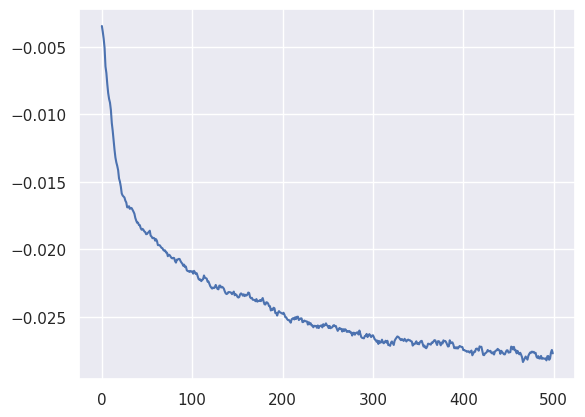

In [464]:
plt.plot(losses)

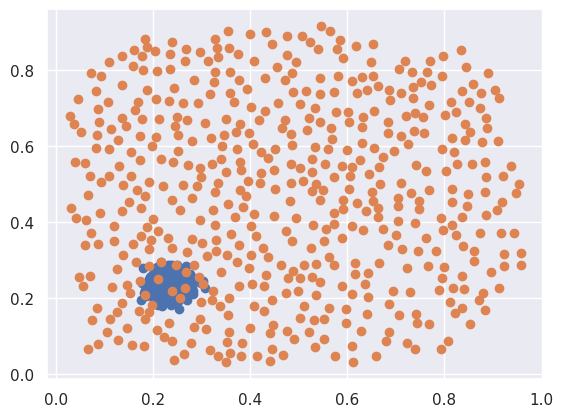

In [465]:
plt.scatter(*jax.vmap(repr_fn)(pop_init).T)
plt.scatter(*jax.vmap(repr_fn)(pop).T)

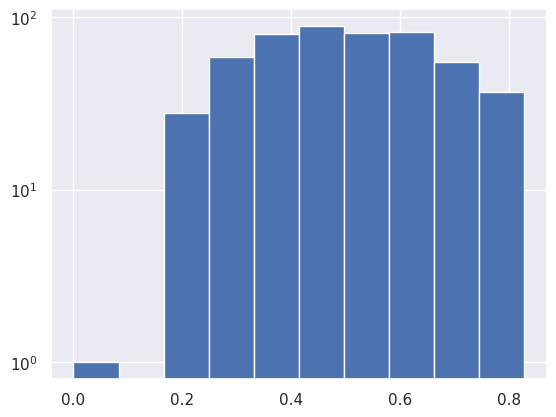

In [442]:
plt.hist(jax.vmap(repr_fn)(pop)[:, 0]);
plt.yscale('log')

In [514]:
import util

In [547]:
data = util.load_pkl("temp_lenia", "data")
pop = util.load_pkl("temp_lenia", "pop")

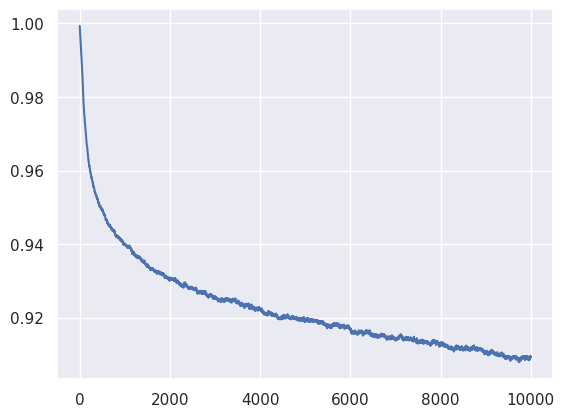

In [548]:
plt.plot(data['loss'])

In [549]:
z = pop['z_img_final']
D = -(z@z.T)
D[jnp.arange(len(D)), jnp.arange(len(D))] = np.inf

In [550]:
D.shape

(1024, 1024)

In [551]:
D.min(axis=-1).mean()

-0.91017866

In [552]:
x = UMAP(metric='cosine').fit_transform(z)

In [553]:
x.shape

(1024, 2)

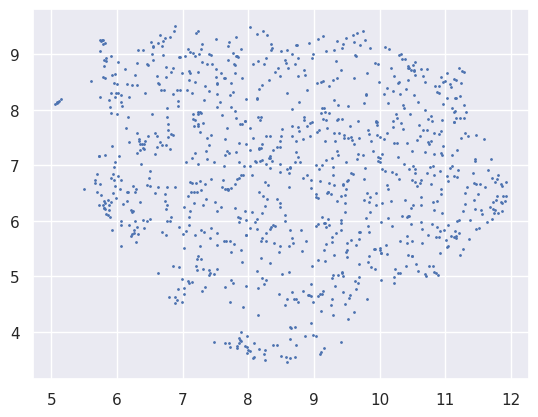

In [554]:
plt.scatter(*x.T, s=1.)

In [561]:
img = rearrange(pop['img_final'][:], "(R C) H W D -> (R H) (C W) D", R=32).astype(np.uint8)

In [562]:
img.shape, img.dtype

((7168, 7168, 3), dtype('uint8'))

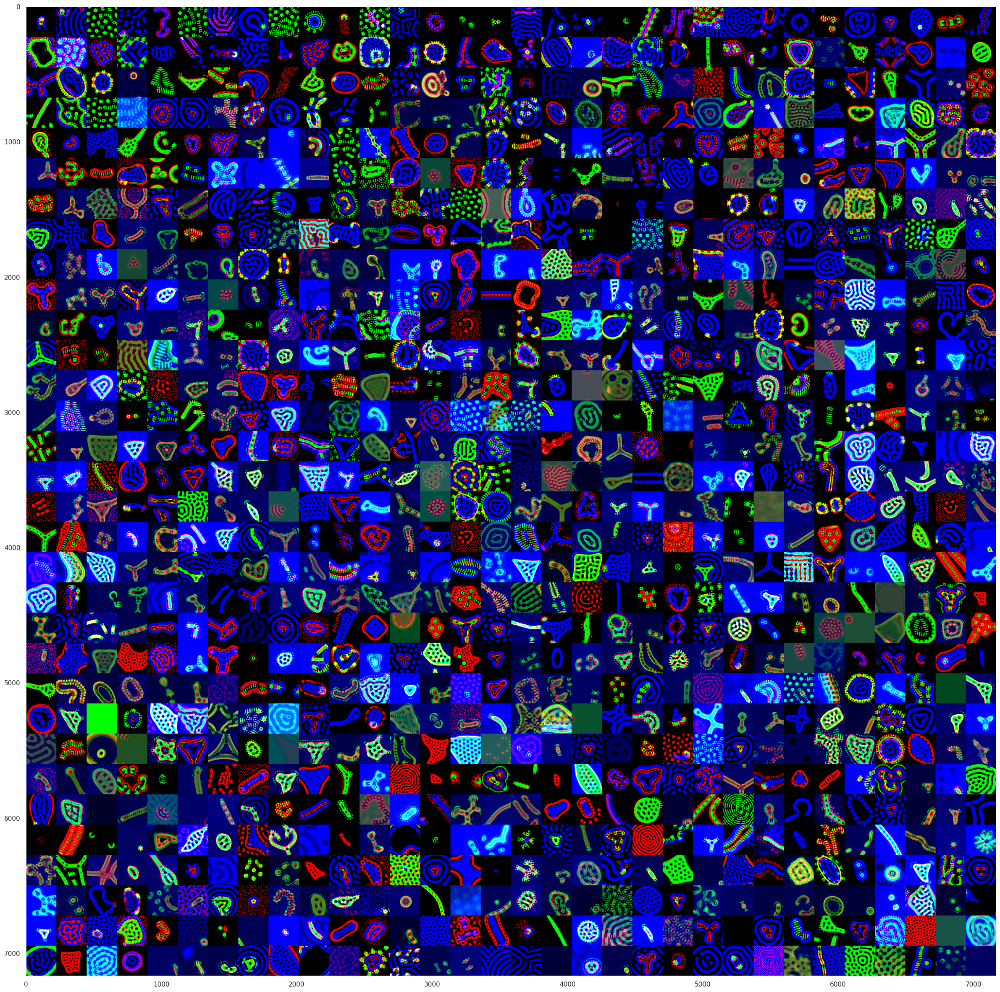

In [563]:
plt.figure(figsize=(30, 30))
plt.imshow(img)
plt.grid(False)

In [572]:
x = UMAP(n_components=1, metric='cosine').fit_transform(z)

In [573]:
x.shape

(1024, 1)

In [575]:
idx = x[:, 0].argsort()

In [576]:
img = rearrange(pop['img_final'][idx], "(R C) H W D -> (R H) (C W) D", R=32).astype(np.uint8)

In [577]:
img.shape

(7168, 7168, 3)

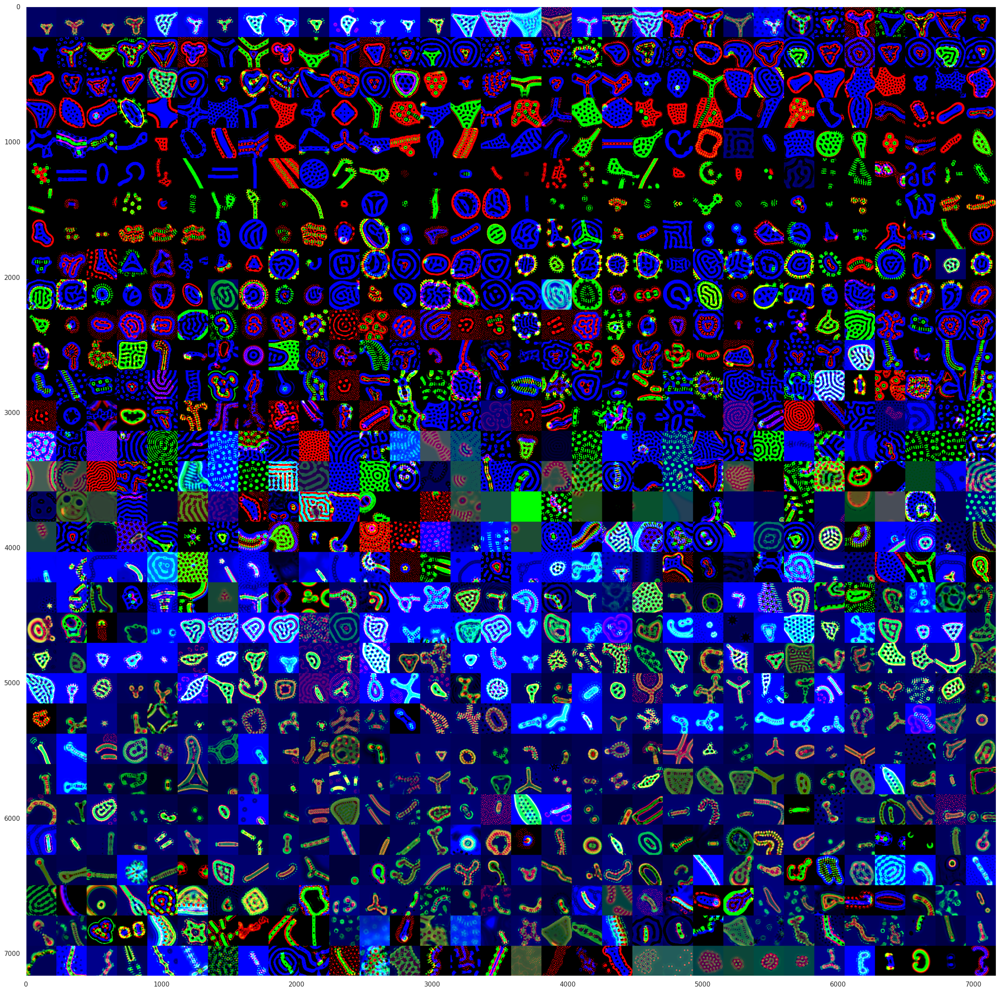

In [578]:
plt.figure(figsize=(30, 30))
plt.imshow(img)
plt.grid(False)

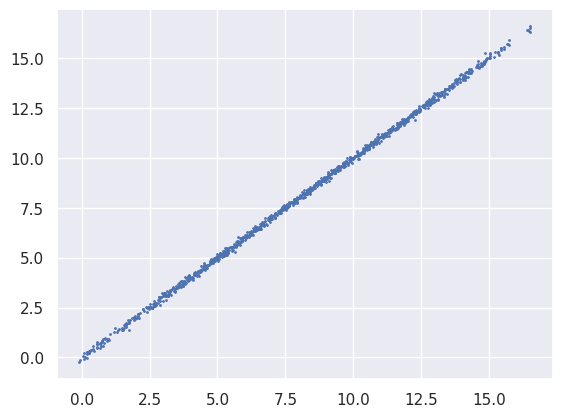

In [586]:
plt.scatter(x[:, 0], x[:, 0]+.1*np.random.randn(*x.flatten().shape), s=1.0)

In [23]:
from models_nca import NCA

In [24]:
sim = NCA(grid_size=64, d_state=1, p_drop=0.)

In [38]:
@jax.jit
def unroll_params(rng, params):
    def step(state, _rng):
        next_state = sim.step_state(_rng, state, params)
        return next_state, state
    state_init = sim.init_state(rng, params)
    state_final, state_vid = jax.lax.scan(step, state_init, split(rng, 1024))

    img_init = sim.render_state(state_init, params=params, img_size=224)
    img = sim.render_state(state_final, params=params, img_size=224)
    # z_img = clip_model.embed_img(img)
    return dict(img_init=img_init, img=img)

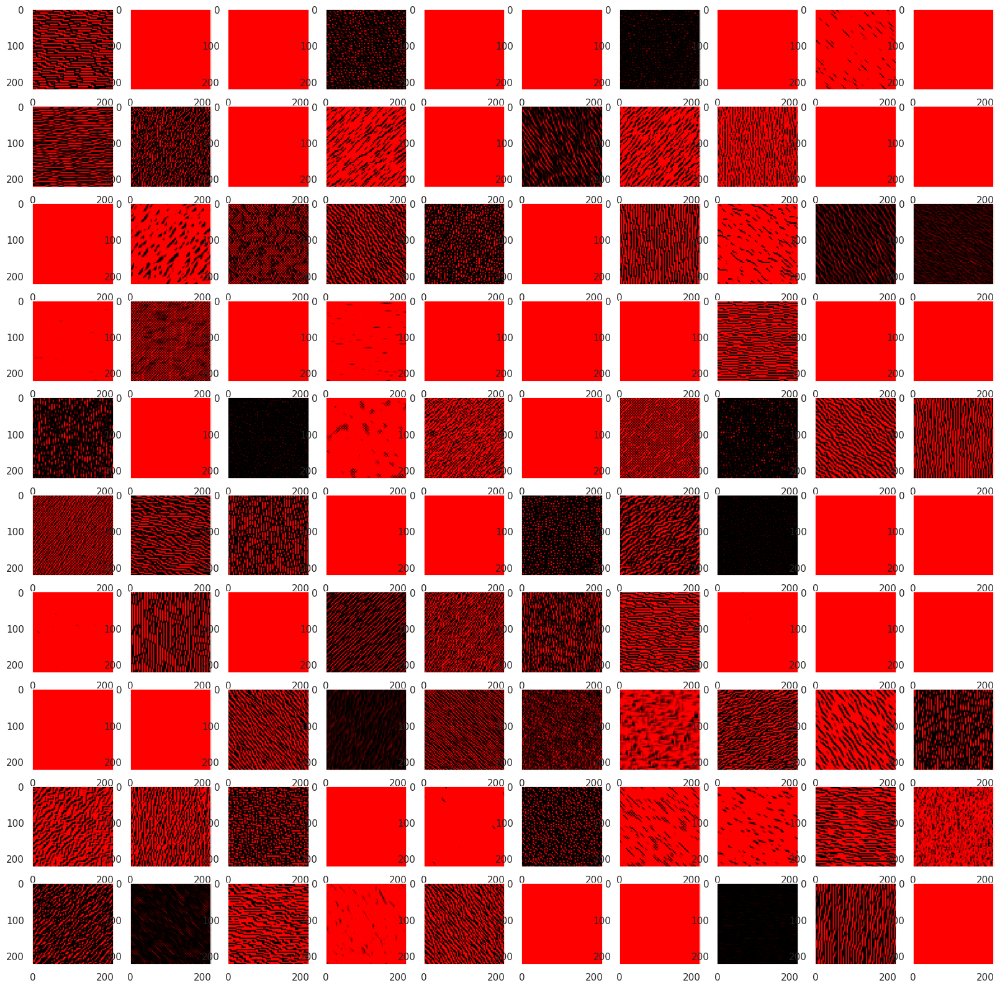

In [48]:
plt.figure(figsize=(20, 20))
for i in range(100):
    rng = jax.random.PRNGKey(i)
    params = sim.default_params(rng)

    plt.subplot(10, 10, i+1)
    plt.imshow(unroll_params(rng, params)['img'])
    plt.grid(False)
plt.show()

In [51]:
from collections import namedtuple
import jax.numpy as jp

In [96]:
Params = namedtuple('Params', 'mu_k sigma_k w_k mu_g sigma_g c_rep')
Fields = namedtuple('Fields', 'U G R E')

def peak_f(x, mu, sigma):
  return jp.exp(-((x-mu)/sigma)**2)

def fields_f(p: Params, points, x):
  r = jp.sqrt(jp.square(x-points).sum(-1).clip(1e-10))
  U = peak_f(r, p.mu_k, p.sigma_k).sum()*p.w_k
  G = peak_f(U, p.mu_g, p.sigma_g)
  R = p.c_rep/2 * ((1.0-r).clip(0.0)**2).sum()
  return Fields(U, G, R, E=R-G)

def motion_f(params, points):
  grad_E = jax.grad(lambda x : fields_f(params, points, x).E)
  return -jax.vmap(grad_E)(points)

In [102]:

def odeint_euler(f, params, x0, dt, n):
  def step_f(x, _):
    x = x+dt*f(params, x)
    return x, x
  return jax.lax.scan(step_f, x0, None, n)[1]

def lerp(x, a, b):
  return jp.float32(a)*(1.0-x) + jp.float32(b)*x
def cmap_e(e):
  return 1.0-jp.stack([e, -e], -1).clip(0) @ jp.float32([[0.3,1,1], [1,0.3,1]])
def cmap_ug(u, g):
  vis = lerp(u[...,None], [0.1,0.1,0.3], [0.2,0.7,1.0])
  return lerp(g[...,None], vis, [1.17,0.91,0.13])

def vmap2(f):
  return jax.vmap(jax.vmap(f))

@partial(jax.jit, static_argnames=['w', 'show_UG', 'show_cmap'])
def show_lenia(params, points, extent, w=400, show_UG=False, show_cmap=True):
  xy = jp.mgrid[-1:1:w*1j, -1:1:w*1j].T*extent
  e0 = -peak_f(0.0, params.mu_g, params.sigma_g)
  f = partial(fields_f, params, points)
  fields = vmap2(f)(xy)
  r2 = jp.square(xy[...,None,:]-points).sum(-1).min(-1)
  points_mask = (r2/0.02).clip(0, 1.0)[...,None]
  vis = cmap_e(fields.E-e0) * points_mask
  if show_cmap:
    e_mean = jax.vmap(f)(points).E.mean()
    bar = np.r_[0.5:-0.5:w*1j]
    bar = cmap_e(bar) * (1.0-peak_f(bar, e_mean-e0, 0.005)[:,None])
    vis = jp.hstack([vis, bar[:,None].repeat(16, 1)])
  if show_UG:
    vis_u = cmap_ug(fields.U, fields.G)*points_mask
    if show_cmap:
      u = np.r_[1:0:w*1j]
      bar = cmap_ug(u, peak_f(u, params.mu_g, params.sigma_g))
      bar = bar[:,None].repeat(16, 1)
      vis_u = jp.hstack([bar, vis_u])
    vis = jp.hstack([vis_u, vis])
  return vis



In [169]:
params = Params(mu_k=4.0, sigma_k=1.0, w_k=0.022, mu_g=0.6, sigma_g=0.15, c_rep=1.0)
key = jax.random.PRNGKey(20)
points0 = (jax.random.uniform(key, [256, 2])-0.5)*12.0
dt = 0.1
rotor_story = odeint_euler(motion_f, params, points0, dt, 10000)
# animate_lenia(params, rotor_story, name='rotor.mp4')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.000101993246..1.17].


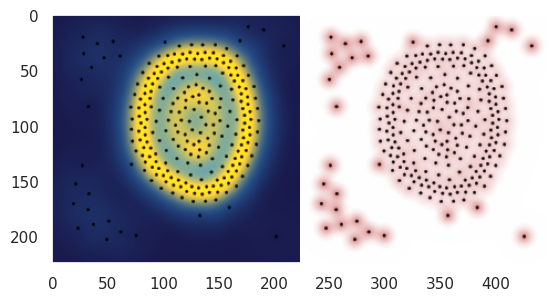

In [170]:
extent = jp.abs(rotor_story).max()*1.1
img = show_lenia(params, rotor_story[-1], extent=extent, w=224, show_UG=True, show_cmap=False)
plt.imshow(img)
plt.grid(False)

In [173]:
img[:, :224].max()

Array(1.17, dtype=float32)

In [175]:
from models_plenia import ParticleLenia

In [185]:
sim = ParticleLenia()

@jax.jit
def unroll_params(rng, params):
    def step(state, _rng):
        next_state = sim.step_state(_rng, state, params)
        return next_state, state
    state_init = sim.init_state(rng, params)
    state_final, state_vid = jax.lax.scan(step, state_init, split(rng, 256))

    img_init = sim.render_state(state_init, params=params, img_size=224)
    img = sim.render_state(state_final, params=params, img_size=224)
    # z_img = clip_model.embed_img(img)
    return dict(img_init=img_init, img=img)

In [186]:
params = sim.default_params(None)

In [188]:
a = unroll_params(rng, params)

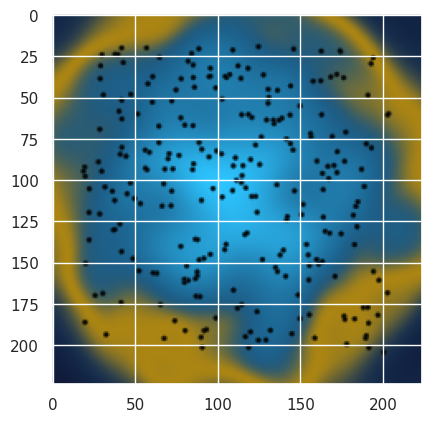

In [189]:
plt.imshow(a['img_init'])

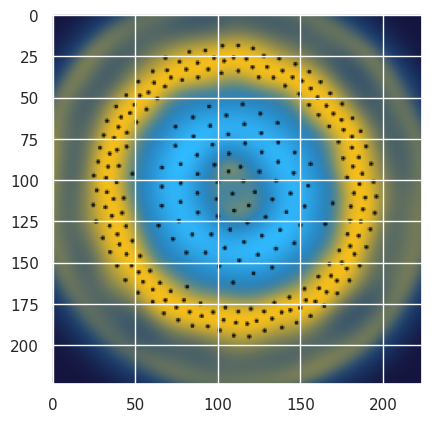

In [190]:
plt.imshow(a['img'])

In [321]:
from models_cppn import CPPN

In [322]:
cppn = CPPN(d_dim=8, n_layers=3, activation='relu', inputs='xy')
rng = jax.random.PRNGKey(0)

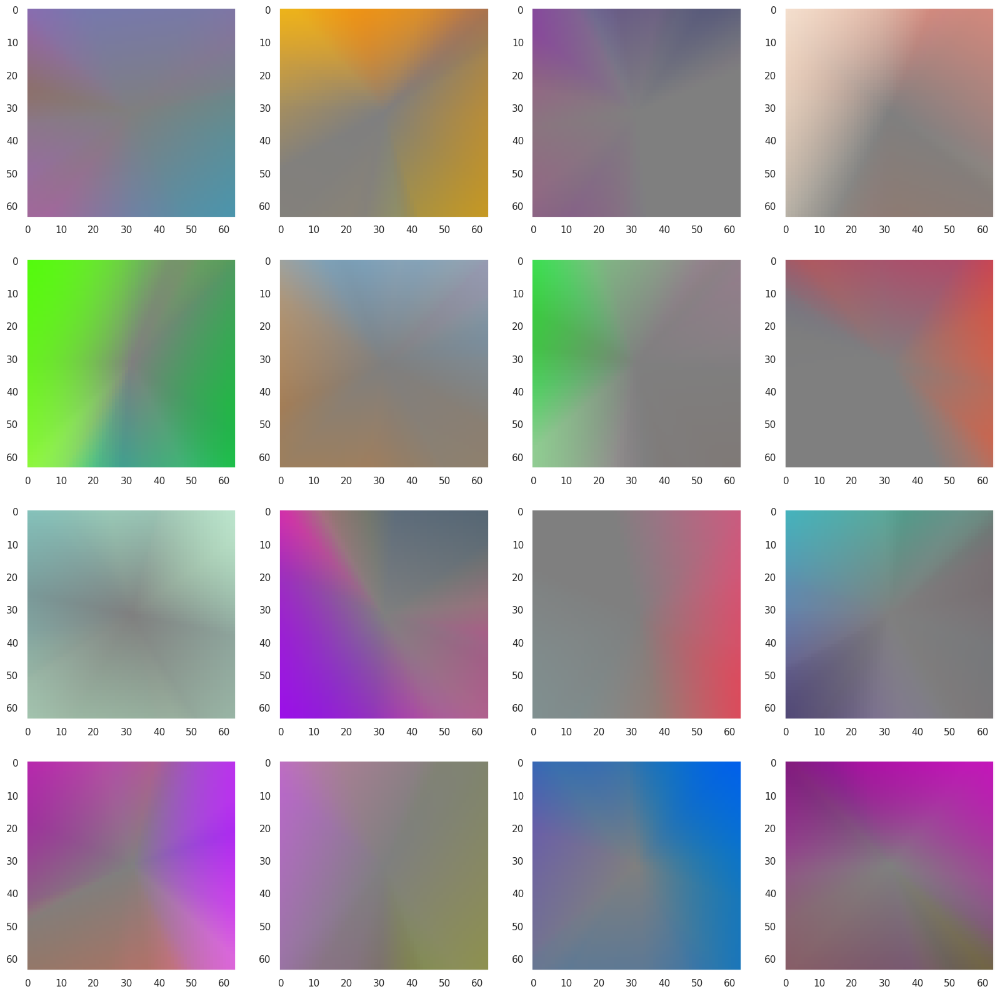

In [323]:
plt.figure(figsize=(20, 20))
for i in range(16):
    rng = jax.random.PRNGKey(i)
    params = cppn.default_params(rng)
    plt.subplot(4, 4, i+1)
    plt.imshow(cppn.render(params))
    plt.grid(False)
plt.show()

In [324]:
jax.tree.map(lambda x: x.shape, params)

{'net_params': {'params': {'Dense_0': {'bias': (8,), 'kernel': (2, 8)},
   'Dense_1': {'bias': (8,), 'kernel': (8, 8)},
   'Dense_2': {'bias': (8,), 'kernel': (8, 8)},
   'Dense_3': {'bias': (3,), 'kernel': (8, 3)}}}}

In [298]:
sum([p.size for p in jax.tree.leaves(params)])

211

In [8]:
from models_boids import Boids

In [9]:
sim = Boids(256, 8, dt=0.001)
rng = jax.random.PRNGKey(0)

2024-08-22 11:10:10.747603: W external/xla/xla/service/gpu/nvptx_compiler.cc:765] The NVIDIA driver's CUDA version is 12.4 which is older than the ptxas CUDA version (12.5.40). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [255]:
def get_vid(rng, params):
    def step(state, _rng):
        next_state = sim.step_state(_rng, state, params)
        return next_state, state
    state_init = sim.init_state(rng, params)
    state_final, state_vid = jax.lax.scan(step, state_init, split(rng, 1024))
    vid = jax.vmap(partial(sim.render_state, params=params, img_size=224))(state_vid)
    # img = rearrange(vid[::vid.shape[0]//8], "(R C) H W D -> (R H) (C W) D", R=1)
    # plt.figure(figsize=(15, 5))
    # plt.imshow(img)
    # plt.grid(False)
    # plt.show()
    return vid

In [256]:
vid = get_vid(rng, params)
vid = np.array((vid*255).astype(jnp.uint8))

In [257]:
vid.shape, vid.dtype, vid.max()

((1024, 224, 224, 3), dtype('uint8'), 255)

In [258]:
import imageio
imageio.mimwrite(f'./temp/boids.gif', vid, fps=50)

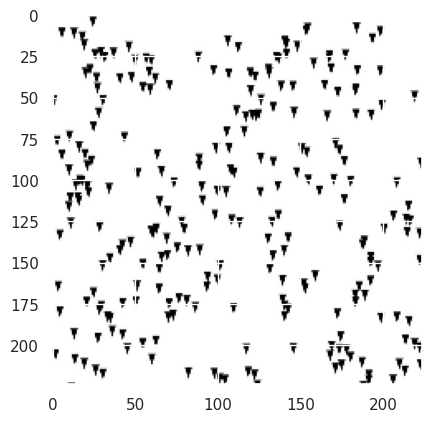

In [259]:
plt.imshow(vid[-100])

In [10]:
params = sim.default_params(rng)
state = sim.init_state(rng, params)
_ = sim.step_state(rng, state, params)

TypeError: BoidNetwork.__call__() missing 1 required positional argument: 'mask'

In [ ]:
jax.tree.map(lambda x: x.shape, params)

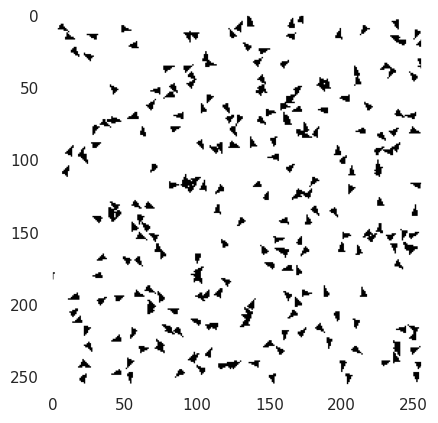

In [159]:
img = boids.render_state(state, params)
plt.imshow(img)
plt.grid(False)